# Class Activation Maps

**A method to visualize discriminative image regions and perform object localization without bounding box annotations.**

**Author**: Johannes S. Fischer

**Blog Post**: [here](https://johfischer.com/2022/01/27/class-activation-maps/)

For a university project we investigated the question of where a deep convolutional neural network (CNN) looks at, when classifying emotions. For this purpose, we evaluated three visualization methods for CNNs, one of which, the simplest, I would like to share in this post.

The method is called Class Activation Mapping and was introduced in the paper Learning Deep Features for Discriminative Localization by Zhou et al. (2016) [5]. Besides proposing a method to visualize the discriminative regions of a classification-trained convolutional neural network (CNN), the authors also use this method to localize objects without providing the model with any bounding box annotations. The model just learns the classification task with class labels and is then able to localize the object of a specific class in an image. The results might look like this:

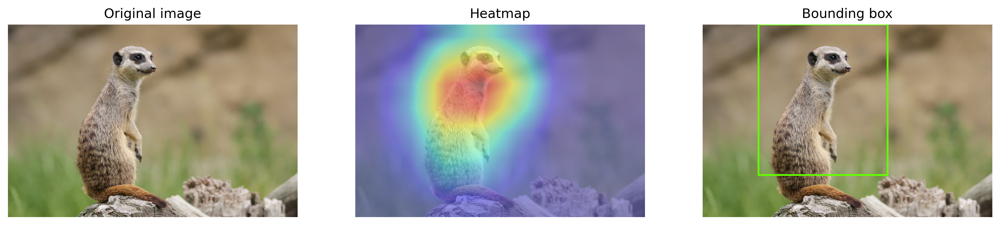

In this post I will first introduce the approach and then present a simple implementation of it in ```tensorflow```.

## Implementation
Let's first import the required packages.

In [1]:
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

# pretrained inception model
import tensorflow.keras.applications.inception_v3 as inception_v3

### Model
As the use of Class Activation Maps proposed by this paper is restricted to networks with global average pooling layers directly before the softmax classification layer, I will use the InceptionV3 network [4] which is a revised version of the GoogLeNet network.

In [2]:
# load model
model = inception_v3.InceptionV3(weights='imagenet')

### Image
The image for classification is the following, which I just downloaded from the internet.

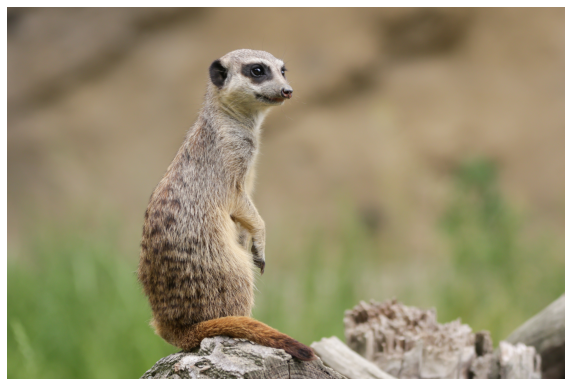

In [3]:
IMG_NAME = 'meerkat.jpg'
img = plt.imread(IMG_NAME)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show()

### Preprocessing Image
For the inception network the image needs to have a specific size ($299 \times 299$), therefore we need to resize it. Furthermore, we need to make a batch out of it (expand the dimensions so that is has shape (1, 299, 299, 3)) and preprocess it. The tensorflow inception module provides us a function for that, which converts the images from RGB to BGR and then zero-centers each color channel with respect to the ImageNet dataset.

In [4]:
x = cv2.resize(img, (299, 299))
x = np.expand_dims(x, axis=0) 
x = inception_v3.preprocess_input(x)

Let's see what the model predicts for our image.

In [5]:
preds = model.predict(x)

preds_decoded = inception_v3.decode_predictions(preds)[0]

_, label, conf = preds_decoded[0]
print("Label: %s with confidence %.2f%%" % (label, conf*100))

# OUTPUT: Label meerkat with confidence 93.51%

Label: meerkat with confidence 93.51%


We can see that the model is able to correctly classify the image. So now let's go to the actual CAM algorithm.

### Class Activation Map

The general steps to obtain the Class Activation Map (CAM) are as follows:
* Get the feature maps of the last conv layer
* Get the weights connecting the global average pooling layer with the specific class of the softmax layer
* Multiply each feature map with the corresponding weight to obtain the Class Activation Map

For the first step we have to take a look at the model summary to identify the name of the layer that is directly before the global average pooling layer.

In [6]:
model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 149, 149, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 149, 149, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

From the output we can see that the layer we are searching for is called ```mixed10```. With that information we can build a new model that, besides outputting the classification, also gives us the activations of the feature maps for a specific input image.

In [7]:
last_conv_layer = model.get_layer('mixed10')

model_fm = tf.keras.Model(inputs=model.inputs,
                          outputs=[
                              model.output,
                              last_conv_layer.output
                          ])

When we now feed the image in the altered model, we get both, the feature maps, as well as the prediction.

In [8]:
model_out, feature_maps = model_fm.predict(x)

# get rid of the batch channel, e.g. (1, 1000) -> (1000,)
feature_maps = np.squeeze(feature_maps)
model_out = np.squeeze(model_out)

print(model_out.shape)        # (1000,)
print(feature_maps.shape)     # (8, 8, 2048)

(1000,)
(8, 8, 2048)


The last convolutional operation outputs 2048 feature maps, each with a size of $8 \times 8$. Next, we need to get the weights connecting the ```GlobalAveragePooling``` layer with the softmax classification layer. For now we are only interested in the weights for the winning class. Hence, we need to find the index of the class with highest confidence.

In [9]:
# get weights of last layer
weights = model.layers[-1].weights[0]
print("Weights shape: ", weights.shape)       # (2048, 1000)

# find winning class (highest confidence)
max_idx = np.argmax( model_out )
print(f"Max index: {max_idx} ({model_out[max_idx]*100:.2f}%)")
# OUTPUT: Max index = 299 (93.51%)

Weights shape:  (2048, 1000)
Max index: 299 (93.51%)


The weights matrix has shape $n_F \times n_c$ where $n_F$ is the number of feature maps (or number of outputs of the global average pooling layer) and $n_c$ is the number of classes the model is able to predict.

$$\mathbf{W} = \begin{pmatrix} w_{11} & ... & w_{1 n_c} \\ \vdots & \ddots & \vdots \\ w_{n_F 1} & ... & w_{n_F n_c}\end{pmatrix}$$

| | $o_1$ | $o_2$ | $o_3$ | - |
|:--:|:--:|:--:|:--:|:--:|
| $f_1$ | $w_{11}$ | $w_{12}$ | $w_{13}$ | ... |
| $f_2$ | $w_{21}$ | $w_{22}$ | $w_{23}$ | ... |
| $f_3$ | $w_{31}$ | $w_{32}$ | $w_{23}$ | ... |
| ----- | $w_{n_f 1}$ | $w_{12}$ | $w_{13}$ | ... |

As we only need the weights of the winning class, we can just take the column of the winning class (max_idx) of the matrix above.

In [10]:
winning_weights = weights[:, max_idx]
print(winning_weights.shape)    # (2048,)

(2048,)


As expected, the weight vector has exactly the same number of rows, as we have feature maps in the last layer. So for each feature map we have one corresponding weight. With the notion of feature maps as concept learners, we could say that each weight determines how important the specific concept is for the output/class.

Now we only need to scale each feature map with the corresponding weight. For example, for feature map $k$ which has dimensions $(8 \times 8)$, we multiply each pixel with the scalar value $w_k$.

We could write that in really simple python code:

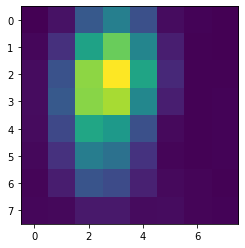

In [11]:
CAM = np.zeros(feature_maps.shape[:2])
for k, wk in enumerate(winning_weights):
    # get feature map k
    feature_map_k = feature_maps[..., k]
    
    # get activation of map k (multiply Fk with wk)
    activation_k = feature_map_k * wk
    
    CAM += activation_k
    
plt.imshow(CAM)
plt.show()

However, this method is quite slow. A faster and nicer way is to use numpy's functionality of multiplying matrices.

(8, 8)


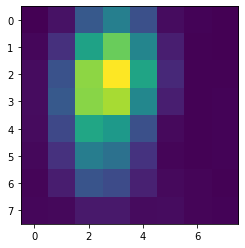

In [12]:
CAM = np.sum(feature_maps * winning_weights, axis=2)

print(CAM.shape)

plt.imshow(CAM)
plt.show()

This looks quite good so far! However, this heatmap is really small, as it only has the dimensions of the feature maps in the last conv layer ($8 \times 8$). To nicely plot it and compare it to our input image, we need to upscale the Class Activation Map to the size of our image.

Plotting the heatmap and the original image size by side we get:

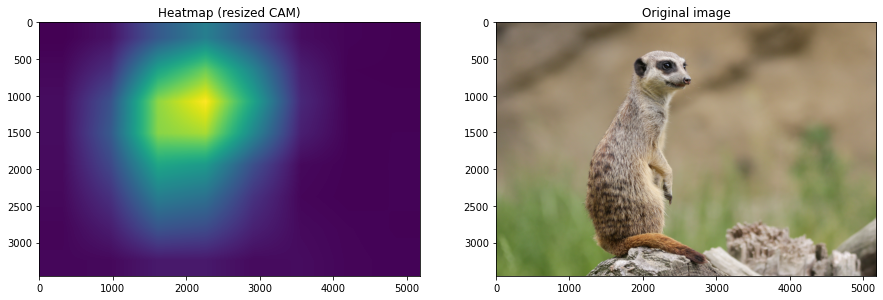

In [13]:
# resize CAM
heatmap = cv2.resize(CAM, (img.shape[1], img.shape[0]))

# plot heatmap and image side by side
plt.subplots(1, 2, figsize=(15, 6))

plt.subplot(1,2,1)
plt.imshow(heatmap)
plt.title('Heatmap (resized CAM)')

plt.subplot(1,2,2)
plt.imshow(img)
plt.title('Original image')

plt.show()

Now if we superimpose the heatmap over the image, we get a pretty good visualization of the regions that are important for the network to identify the meerkat.

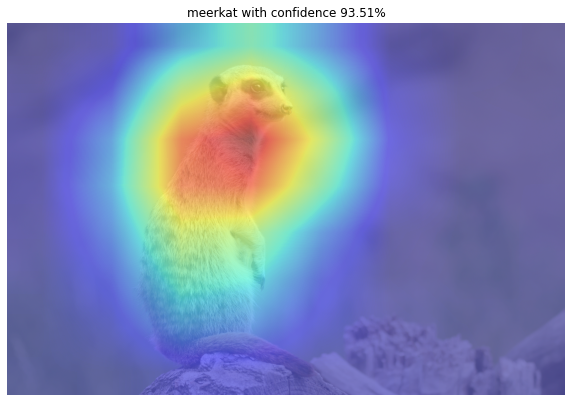

In [14]:
plt.figure(figsize=(10, 10))
plt.imshow(img, alpha=0.5)
plt.imshow(heatmap, cmap='jet', alpha=0.5)
plt.title(f'{label} with confidence {conf*100:.2f}%')
plt.axis('off')
#plt.savefig('./images/superimpose.png', dpi=300, bbox_inches='tight')
plt.show()

In order to perform localization and generate a bounding box for the class, the authors propose a simple thresholding technique [5]. They first segment the regions where the value is above 20% of the max value of the Class Activation Map and then take the bounding box that covers the largest connected component in the segmentation map.

Max of heatmap: 54.26
Cut-off value: 16.28


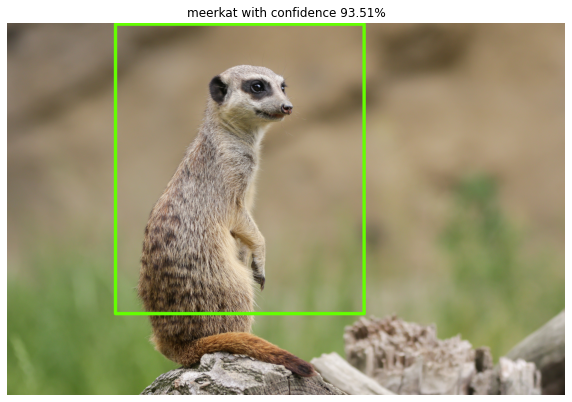

In [15]:
import matplotlib.patches as patches

heatmap_max = np.max(heatmap)
print("Max of heatmap: %.2f" % heatmap_max)

boundary = heatmap_max * 0.3
print("Cut-off value: %.2f" % boundary)

bbox_heatmap = heatmap.copy()
bbox_heatmap = np.where(bbox_heatmap <= boundary, 0, 255)

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

bbox_img = img.copy()

# find contours of heatmap
cnts = cv2.findContours(bbox_heatmap.astype('uint8'),
                        cv2.RETR_EXTERNAL,
                        cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

offset = 10
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(bbox_img, (x+offset, y+offset),
                  (x+offset + w, y + h), (100,255,0), 30)

plt.figure(figsize=(10,10))
plt.imshow(bbox_img)
plt.title(f'{label} with confidence {conf*100:.2f}%')
plt.axis('off')
plt.savefig('./images/detection.png', dpi=300, bbox_inches='tight')
plt.show()

That's how the visualization of discriminative regions and weakly-supervised localization works with Class Activation Mapping. :)

## Conclusion
Class Activation Maps are a useful tool to visualize class-discriminative regions of a deep convolutional neural network. With simple techniques one can obtain a heatmap for these regions and furthermore, use this heatmap to localize and object and draw a bounding box around it. Hence, the method allows to learn an object localization task solely by using class labels instead of bounding box annotations. However, the Class Activation Mapping approach is quite limited in the sense, that it can only be applied to models having a certain architecture. The model needs to have a global average pooling layer right after the last convolutional layer, followed a classification layer. A newer and more flexible approach, called GradCAM [2] overcomes this limitation by using gradients flowing back from the classification output to the feature maps of the last convolutional layer. This makes the approach somehow independent of the architecture and allows the application to most neural network architectures. In some future post I am planning to write about GradCAM as well. :)

Lastly, I would like to show a small result of our university project. We trained several CNNs on different datasets for emotion recognition and then evaluated different visualization techniques to find out what regions are important to recognize a certain emotion. This is one result we obtained with CAM:

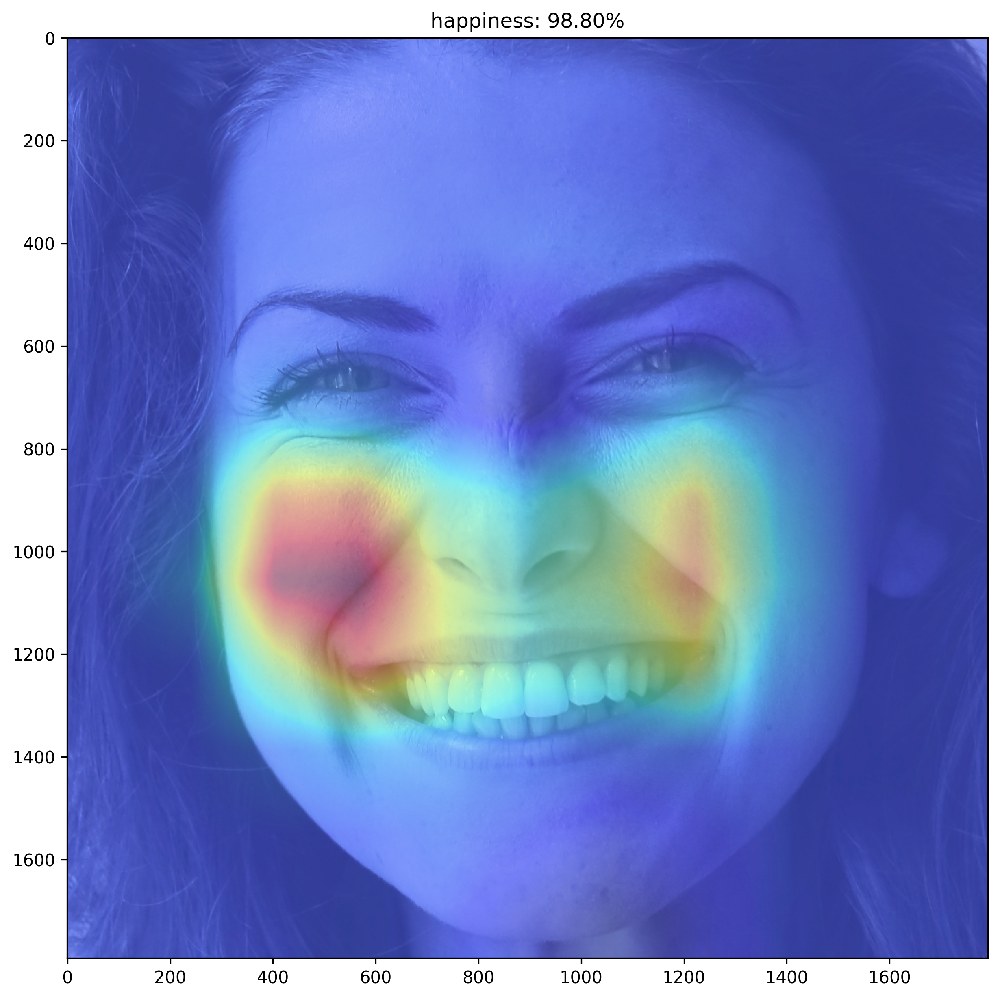

It seems like the laugh lines play a special role in classifying happy people. ;)

## References
[1] Lin, M., Chen, Q., & Yan, S. (2013). Network in network. arXiv preprint arXiv:1312.4400.

[2] Selvaraju, R. R., Cogswell, M., Das, A., Vedantam, R., Parikh, D., & Batra, D. (2017). Grad-cam: Visual explanations from deep networks via gradient-based localization. In Proceedings of the IEEE international conference on computer vision (pp. 618-626).

[3] Szegedy, C., Liu, W., Jia, Y., Sermanet, P., Reed, S., Anguelov, D., ... & Rabinovich, A. (2015). Going deeper with convolutions. In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 1-9).

[4] Szegedy, C., Vanhoucke, V., Ioffe, S., Shlens, J., & Wojna, Z. (2016). Rethinking the inception architecture for computer vision. In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 2818-2826).

[5] Zhou, B., Khosla, A., Lapedriza, A., Oliva, A., & Torralba, A. (2016). Learning deep features for discriminative localization. In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 2921-2929).

---

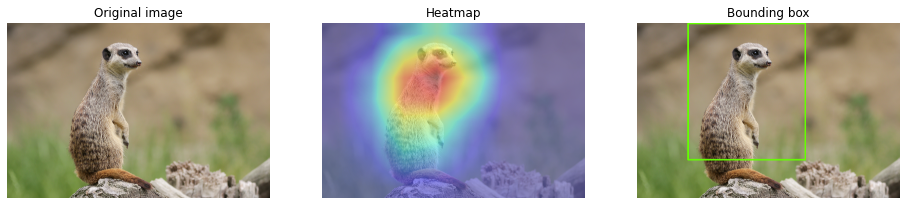

In [16]:
plt.subplots(1,3, figsize=(16, 8))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Original image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(img, alpha=0.6)
plt.imshow(heatmap, cmap='jet', alpha=0.4)
plt.title("Heatmap")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(bbox_img)
plt.title("Bounding box")
plt.axis('off')

plt.savefig('./images/original-heatmap-bbox.png', dpi=300, bbox_inches='tight')
plt.show()

---